In [47]:
# Copy of scott's workbook to do a quick training run of the COCO dataset human split 

## Install Icevision

In [2]:
# ! pip install icevision

In [28]:
from icevision.all import *

## Loading the COCO dataset

In [29]:
# Location of the image root
# Update the path of the nikelogs
data_dir = Path('/home/ubuntu/fastai-live-video-logo-obfuscation/data/')
print(data_dir)
print(type(data_dir))

# Create the parser
# nike_parser = parsers.VOCBBoxParser(annotations_dir=data_dir / "nikelogos/annotations", images_dir=data_dir / "nikelogos/images")
human_parser = parsers.COCOBBoxParser(
    annotations_filepath=data_dir / "annotations/instances_human_tiny_train2017.json", 
    img_dir=data_dir / "images/train2017tiny")

# Parse annotations to create records
# nike_train_records, nike_valid_records = nike_parser.parse()
human_train_records, human_valid_records = human_parser.parse()


# Transforms
# size is set to 384 because EfficientDet requires its inputs to be divisible by 128
image_size = 384
train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=image_size, presize=512), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(image_size), tfms.A.Normalize()])

# Datasets
train_ds = Dataset(human_train_records, train_tfms)
valid_ds = Dataset(human_valid_records, valid_tfms)

len(train_ds), len(valid_ds)


/home/ubuntu/fastai-live-video-logo-obfuscation/data
<class 'pathlib.PosixPath'>


  0%|          | 0/719 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:136


  0%|          | 0/357 [00:00<?, ?it/s]

  0%|          | 0/90 [00:00<?, ?it/s]

(357, 90)

### Understanding the transforms

The Dataset transforms are only applied when we grab (get) an item. Several of the default `aug_tfms` have a random element to them. For example, one might perform a rotation with probability 0.5 where the angle of rotation  is randomly selected between +45 and -45 degrees.

This means that the learner sees a slightly different version of an image each time it is accessed. This effectively increases the size of the dataset and improves learning.

We can look at result of getting the 0th image from the dataset a few times and see the differences. Each time you run the next cell, you will see different results due to the random element in applying transformations.

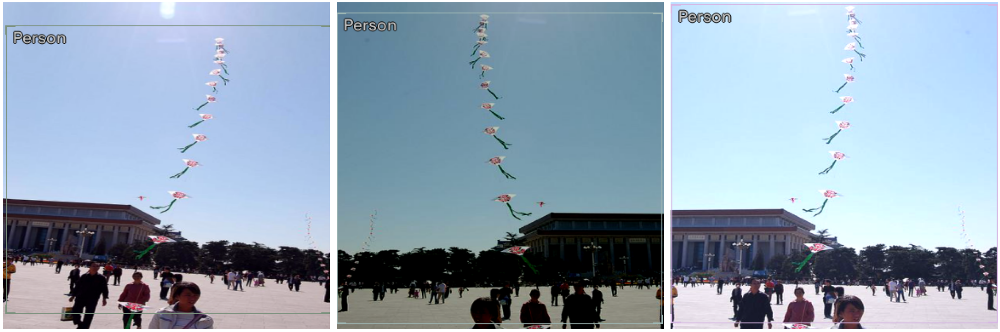

In [30]:
# Show an element of the train_ds with augmentation transformations applied
samples = [train_ds[0] for _ in range(3)]
show_samples(samples, ncols=3)


In [46]:
?? show_samples 

## Select a library, model, and backbone

In order to create a model, we need to:
* Choose one of the **libraries** supported by IceVision
* Choose one of the **models** supported by the library
* Choose one of the **backbones** corresponding to a chosen model

You can access any supported models by following the IceVision unified API, use code completion to explore the available models for each library.



### Creating a model
Selections only take two simple lines of code. For example, to try the mmdet library using the retinanet model and the resnet50_fpn_1x backbone  could be specified by:
```
model_type = models.mmdet.retinanet
backbone = model_type.backbones.resnet50_fpn_1x(pretrained=True)
```
As pretrained models are used by default, we typically leave this out of the backbone creation step.

We've selected a few of the many options below. You can easily pick which option you want to try by setting the value of `selection`. This shows you how easy it is to try new libraries, models, and backbones.


In [31]:
# Just change the value of selection to try another model

selection = 1


extra_args = {}

if selection == 0:
  model_type = models.mmdet.retinanet
  backbone = model_type.backbones.resnet50_fpn_1x

elif selection == 1:
  # The Retinanet model is also implemented in the torchvision library
  model_type = models.torchvision.retinanet
  backbone = model_type.backbones.resnet50_fpn

elif selection == 2:
  model_type = models.ross.efficientdet
  backbone = model_type.backbones.tf_lite0
  # The efficientdet model requires an img_size parameter
  extra_args['img_size'] = image_size

elif selection == 3:
  model_type = models.ultralytics.yolov5
  backbone = model_type.backbones.small
  # The yolov5 model requires an img_size parameter
  extra_args['img_size'] = image_size

model_type, backbone, extra_args

(<module 'icevision.models.torchvision.retinanet' from '/home/ubuntu/miniconda3/envs/py38/lib/python3.8/site-packages/icevision/models/torchvision/retinanet/__init__.py'>,
 {})


Now it is just a one-liner to instantiate the model. If you want to try another *option*, just edit the line at the top of the previous cell.


In [32]:
# Instantiate the mdoel
model = model_type.model(backbone=backbone(pretrained=True), num_classes=len(parser.class_map), **extra_args) 

## Data Loader

The Data Loader is specific to a model_type. The job of the data loader is to get items from a dataset and batch them up in the specific format required by each model. This is why creating the data loaders is separated from creating the datasets.

We can take a look at the first batch of items from the `valid_dl`. Remember that the `valid_tfms` only resized (with padding) and normalized records, so different images, for example, are not returned each time. This is important to provide consistent validation during training.

In [33]:
# Data Loaders
train_dl = model_type.train_dl(train_ds, batch_size=8, num_workers=4, shuffle=True)
valid_dl = model_type.valid_dl(valid_ds, batch_size=8, num_workers=4, shuffle=False)

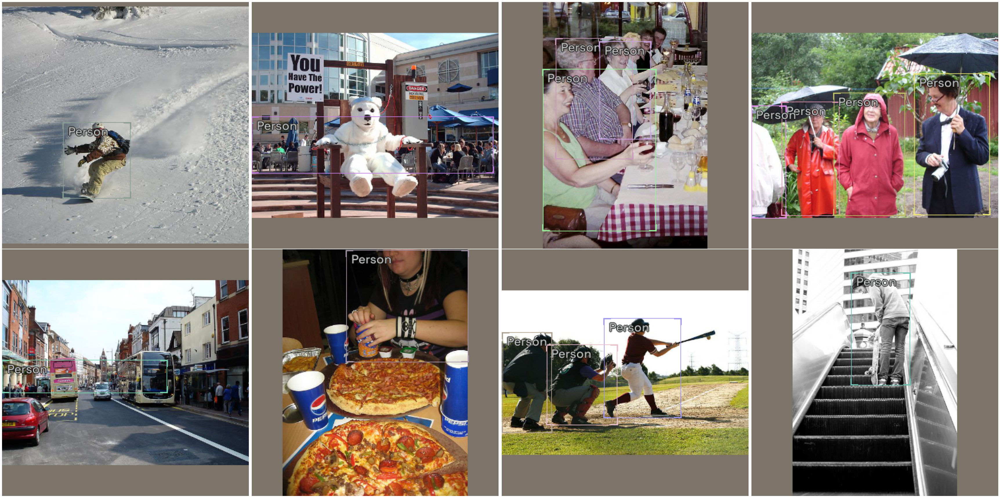

In [35]:
# show batch
model_type.show_batch(first(valid_dl), ncols=4)

In [45]:
help(model_type.show_batch)

Help on function show_batch in module icevision.models.torchvision.faster_rcnn.show_batch:

show_batch(batch, ncols: int = 1, figsize=None, **show_samples_kwargs)
    Show a single batch from a dataloader.
    
    # Arguments
        show_samples_kwargs: Check the parameters from `show_samples`



## Metrics

The fastai and pytorch lightning engines collect metrics to track progress during training. IceVision provides metric classes that work across the engines and libraries.

The same metrics can be used for both fastai and pytorch lightning.

In [36]:
metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]

## Training

IceVision is an agnostic framework meaning it can be plugged into other DL learning engines such as [fastai2](https://github.com/fastai/fastai2), and [pytorch-lightning](https://github.com/PyTorchLightning/pytorch-lightning).  


### Training using fastai

In [37]:
learn = model_type.fastai.learner(dls=[train_dl, valid_dl], model=model, metrics=metrics)

SuggestedLRs(lr_min=1.584893179824576e-05, lr_steep=0.0014454397605732083)

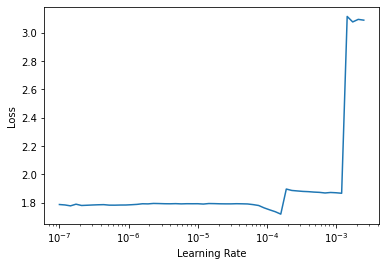

In [38]:
learn.lr_find()

# For Sparse-RCNN, use lower `end_lr`
# learn.lr_find(end_lr=0.005)

In [39]:
learn.fine_tune(20, 1e-4, freeze_epochs=1)

# Model 0 with 40, 1e-4
# 39	0.293704	0.531666	0.355570	00:15

epoch,train_loss,valid_loss,COCOMetric,time
0,1.544497,1.377082,0.014587,00:15


epoch,train_loss,valid_loss,COCOMetric,time
0,1.067786,1.192044,0.020437,00:22
1,0.976166,1.104927,0.045291,00:21
2,0.921058,1.043865,0.066160,00:21
3,0.885461,1.040542,0.066650,00:21
4,0.835604,0.999956,0.094939,00:21
5,0.803552,0.978013,0.094152,00:21
6,0.771287,0.990946,0.141864,00:21
7,0.734364,0.859216,0.177602,00:21
8,0.685801,0.909058,0.145079,00:21
9,0.649975,0.816077,0.186131,00:21


### Training using Pytorch Lightning

In [40]:
class LightModel(model_type.lightning.ModelAdapter):
    def configure_optimizers(self):
        return SGD(self.parameters(), lr=1e-4)
    
light_model = LightModel(model, metrics=metrics)

In [41]:
trainer = pl.Trainer(max_epochs=20, gpus=1)
trainer.fit(light_model, train_dl, valid_dl)

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type      | Params
------------------------------------
0 | model | RetinaNet | 32.2 M
------------------------------------
32.2 M    Trainable params
0         Non-trainable params
32.2 M    Total params
128.758   Total estimated model params size (MB)


Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

/home/ubuntu/miniconda3/envs/py38/lib/python3.8/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:610: LightningDeprecationWarning: Relying on `self.log('val_loss', ...)` to set the ModelCheckpoint monitor is deprecated in v1.2 and will be removed in v1.4. Please, create your own `mc = ModelCheckpoint(monitor='your_monitor')` and use it as `Trainer(callbacks=[mc])`.
  warning_cache.deprecation(


Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

## Using the model - inference and showing results

The first step in reviewing the model is to show results from the validation dataset. This is easy to do with the `show_results` function.

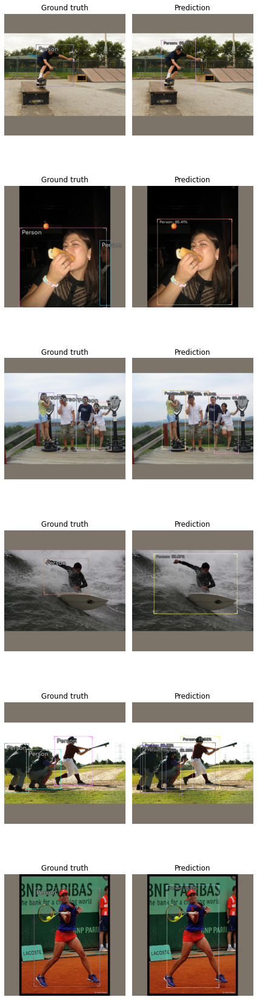

In [42]:
model_type.show_results(model, valid_ds, detection_threshold=.5)

### Prediction

Sometimes you want to have more control than `show_results` provides. You can construct an inference dataloader using `infer_dl` from any IceVision dataset and pass this to `predict_dl` and use `show_preds` to look at the predictions.

A prediction is returned as a dict with keys: `scores`, `labels`, `bboxes`, and possibly `masks`. 

Prediction functions that take a `detection_threshold` argument will only return the predictions whose score is above the threshold.

Prediction functions that take a `keep_images` argument will only return the (tensor representation of the) image when it is `True`. In interactive environments, such as a notebook, it is helpful to see the image with bounding boxes and labels applied. In a deployment context, however, it is typically more useful (and efficient) to return the bounding boxes by themselves.



> NOTE: For a more detailed look at inference check out the [inference tutorial](https://airctic.com/dev/inference/)

In [43]:
infer_dl = model_type.infer_dl(valid_ds, batch_size=4, shuffle=False)
preds = model_type.predict_from_dl(model, infer_dl, keep_images=True)

  0%|          | 0/23 [00:00<?, ?it/s]

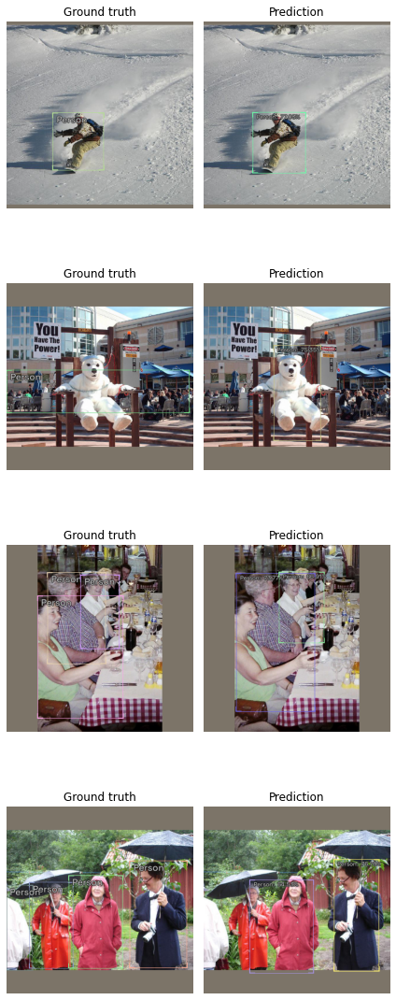

In [44]:
show_preds(preds=preds[:4])